# Topic + Sentiment

## Packages

In [2]:
from pathlib import Path
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from datetime import datetime
import os
import sys
import csv
import re
import pandas as pd
import numpy as np
import plotly
import plotly.express as px
import plotly.graph_objects as go

# Basic paths
project_path = Path().resolve().parent
csv_path = project_path / "data"

## Data Frame Joining

In [3]:
df1 = pd.read_csv(csv_path / "results_sa_all.txt", infer_datetime_format = True, parse_dates = ["date"]) 
df2 = pd.read_csv(csv_path / "topic_lda.csv")
df2

,title,pages,date,location,highest_speaker_count,content,country,count_commas,state,city,...,main_topic_6,main_topic_6_perc,main_topic_7,main_topic_7_perc,main_topic_8,main_topic_8_perc,main_topic_9,main_topic_9_perc,main_topic_10,main_topic_10_perc
0,CGI_2013,19,2013-09-24,"Sheraton New York Hotel and Towers, New York, ...",10,Hillary Clinton: Thank you very much. I have t...,USA,2,New York,New York,...,Topic 2,0.004650,Topic 6,0.004650,Topic 8,0.004650,Topic 3,0.004650,Topic 9,0.004650
1,Prayer_Breakfast_2016,7,2016-02-04,"Washington Hilton, Washington D.C.",0,"Well, good morning. Giving all praise and hono...",USA,1,no_state,Washington D.C.,...,Topic 6,0.013213,Topic 2,0.013213,Topic 3,0.013213,Topic 10,0.013213,Topic 7,0.013213
2,Security_Team_Announcement,5,2008-12-01,"Chicago, Illinois",0,"Good morning, everybody. I hope you all had a ...",USA,1,Illinois,Chicago,...,Topic 6,3.309813,Topic 5,0.015630,Topic 1,0.015629,Topic 4,0.015629,Topic 7,0.015629
3,Cairo_University,14,2009-06-04,"Cairo, Egypt",0,Thank you so much. Good afternoon. I am honore...,Egypt,1,no_state,Cairo,...,Topic 5,0.502934,Topic 3,0.005579,Topic 6,0.005579,Topic 7,0.005579,Topic 4,0.005579
4,Umpqua_Community_College_Shootings,4,2015-10-01,Washington D.C.,0,There's been another mass shooting in America ...,USA,0,no_state,Washington D.C.,...,Topic 1,0.027939,Topic 5,0.027939,Topic 6,0.027939,Topic 10,0.027938,Topic 9,0.027937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,ASEAN_Business_2015,9,2015-11-21,"Shangri-La Hotel, Kuala Lumpur, Malaysia",0,"Thank you so much. Please be seated. Well, goo...",Malaysia,2,no_state,Kuala Lumpur,...,Topic 8,0.007521,Topic 1,0.007521,Topic 9,0.007520,Topic 2,0.007520,Topic 4,0.007520
432,Finance_Crisis_Fee,3,2010-01-14,unknown_location,0,"Thank you, everybody, for being here. As we al...",USA,0,no_state,Washington D.C.,...,Topic 9,0.026603,Topic 8,0.026602,Topic 2,0.026602,Topic 10,0.026601,Topic 4,0.026600
433,YLAI_Town_Hall,22,2016-03-23,"Usina Del Arte, Buenos Aires, Argentina",25,Hola! Thank you. Thank you so much. Muchas gra...,Argentina,2,no_state,Buenos Aires,...,Topic 9,6.194109,Topic 1,5.821842,Topic 2,0.005122,Topic 8,0.005122,Topic 3,0.005121
434,Oval_Office_Counter_Terrorism_Agenda,5,2015-12-06,"White House, Washington D.C.",0,"Good evening. On Wednesday, 14 Americans were ...",USA,1,no_state,Washington D.C.,...,Topic 5,0.014623,Topic 2,0.014623,Topic 6,0.014623,Topic 7,0.014622,Topic 10,0.014622


In [4]:
# Only take into account speech types - No Q&A formats
df2 = df2[df2['highest_speaker_count']<= 3]
print("Shape of df1:", df1.shape, "\nShape of df2:", df2.shape)

Shape of df1: (346, 6) 
Shape of df2: (346, 31)


In [5]:
df = pd.merge(df1, df2, how = "inner", on= "title") 
df = df.drop(columns = 'date_y')
df.rename(columns = {'date_x' : 'date'}, inplace=True)
df

,title,date,stanza,textblob,vader,subjectivity,pages,location,highest_speaker_count,content,...,main_topic_6,main_topic_6_perc,main_topic_7,main_topic_7_perc,main_topic_8,main_topic_8_perc,main_topic_9,main_topic_9_perc,main_topic_10,main_topic_10_perc
0,Prayer_Breakfast_2016,2016-02-04,0.099,0.178,1.000,0.542,7,"Washington Hilton, Washington D.C.",0,"Well, good morning. Giving all praise and hono...",...,Topic 6,0.013213,Topic 2,0.013213,Topic 3,0.013213,Topic 10,0.013213,Topic 7,0.013213
1,Security_Team_Announcement,2008-12-01,0.140,0.162,0.998,0.403,5,"Chicago, Illinois",0,"Good morning, everybody. I hope you all had a ...",...,Topic 6,3.309813,Topic 5,0.015630,Topic 1,0.015629,Topic 4,0.015629,Topic 7,0.015629
2,Cairo_University,2009-06-04,-0.150,0.110,1.000,0.457,14,"Cairo, Egypt",0,Thank you so much. Good afternoon. I am honore...,...,Topic 5,0.502934,Topic 3,0.005579,Topic 6,0.005579,Topic 7,0.005579,Topic 4,0.005579
3,Umpqua_Community_College_Shootings,2015-10-01,-0.250,0.061,-0.998,0.435,4,Washington D.C.,0,There's been another mass shooting in America ...,...,Topic 1,0.027939,Topic 5,0.027939,Topic 6,0.027939,Topic 10,0.027938,Topic 9,0.027937
4,White_House_Correspondent_Dinner_2013,2013-04-27,-0.012,0.145,1.000,0.501,6,"Washington Hilton Hotel, Washington D.C.",0,"Thank you. Thank you, everybody. How do you li...",...,Topic 2,0.019500,Topic 7,0.019499,Topic 3,0.019498,Topic 10,0.019497,Topic 9,0.019497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,Shimon_Peres_Memorial,2016-09-30,-0.083,0.164,1.000,0.436,6,"Mount Herzl, Jerusalem, Israel",0,"Zvia, Yoni, Chemi and generations of the Peres...",...,Topic 10,0.016783,Topic 4,0.016783,Topic 2,0.016782,Topic 3,0.016782,Topic 7,0.016782
342,ASEAN_Business_2015,2015-11-21,-0.050,0.164,1.000,0.399,9,"Shangri-La Hotel, Kuala Lumpur, Malaysia",0,"Thank you so much. Please be seated. Well, goo...",...,Topic 8,0.007521,Topic 1,0.007521,Topic 9,0.007520,Topic 2,0.007520,Topic 4,0.007520
343,Finance_Crisis_Fee,2010-01-14,-0.412,0.080,0.987,0.436,3,unknown_location,0,"Thank you, everybody, for being here. As we al...",...,Topic 9,0.026603,Topic 8,0.026602,Topic 2,0.026602,Topic 10,0.026601,Topic 4,0.026600
344,Oval_Office_Counter_Terrorism_Agenda,2015-12-06,-0.134,0.076,-1.000,0.398,5,"White House, Washington D.C.",0,"Good evening. On Wednesday, 14 Americans were ...",...,Topic 5,0.014623,Topic 2,0.014623,Topic 6,0.014623,Topic 7,0.014622,Topic 10,0.014622


### Saving topic_sa.txt

In [6]:
# Save the results as csv (Backup)
df.to_csv(csv_path / "topic_sa.txt", index=False)

# Sentiment Scores per Topic Group (LDA)

Mean of the sentiment and subjectivity scores in each topic group extracted by LDA.

In [7]:
df = pd.read_csv(csv_path / "topic_sa.txt", infer_datetime_format = True, parse_dates = ["date"]) # Call the saved merged table 
df

,title,date,stanza,textblob,vader,subjectivity,pages,location,highest_speaker_count,content,...,main_topic_6,main_topic_6_perc,main_topic_7,main_topic_7_perc,main_topic_8,main_topic_8_perc,main_topic_9,main_topic_9_perc,main_topic_10,main_topic_10_perc
0,Prayer_Breakfast_2016,2016-02-04,0.099,0.178,1.000,0.542,7,"Washington Hilton, Washington D.C.",0,"Well, good morning. Giving all praise and hono...",...,Topic 6,0.013213,Topic 2,0.013213,Topic 3,0.013213,Topic 10,0.013213,Topic 7,0.013213
1,Security_Team_Announcement,2008-12-01,0.140,0.162,0.998,0.403,5,"Chicago, Illinois",0,"Good morning, everybody. I hope you all had a ...",...,Topic 6,3.309813,Topic 5,0.015630,Topic 1,0.015629,Topic 4,0.015629,Topic 7,0.015629
2,Cairo_University,2009-06-04,-0.150,0.110,1.000,0.457,14,"Cairo, Egypt",0,Thank you so much. Good afternoon. I am honore...,...,Topic 5,0.502934,Topic 3,0.005579,Topic 6,0.005579,Topic 7,0.005579,Topic 4,0.005579
3,Umpqua_Community_College_Shootings,2015-10-01,-0.250,0.061,-0.998,0.435,4,Washington D.C.,0,There's been another mass shooting in America ...,...,Topic 1,0.027939,Topic 5,0.027939,Topic 6,0.027939,Topic 10,0.027938,Topic 9,0.027937
4,White_House_Correspondent_Dinner_2013,2013-04-27,-0.012,0.145,1.000,0.501,6,"Washington Hilton Hotel, Washington D.C.",0,"Thank you. Thank you, everybody. How do you li...",...,Topic 2,0.019500,Topic 7,0.019499,Topic 3,0.019498,Topic 10,0.019497,Topic 9,0.019497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,Shimon_Peres_Memorial,2016-09-30,-0.083,0.164,1.000,0.436,6,"Mount Herzl, Jerusalem, Israel",0,"Zvia, Yoni, Chemi and generations of the Peres...",...,Topic 10,0.016783,Topic 4,0.016783,Topic 2,0.016782,Topic 3,0.016782,Topic 7,0.016782
342,ASEAN_Business_2015,2015-11-21,-0.050,0.164,1.000,0.399,9,"Shangri-La Hotel, Kuala Lumpur, Malaysia",0,"Thank you so much. Please be seated. Well, goo...",...,Topic 8,0.007521,Topic 1,0.007521,Topic 9,0.007520,Topic 2,0.007520,Topic 4,0.007520
343,Finance_Crisis_Fee,2010-01-14,-0.412,0.080,0.987,0.436,3,unknown_location,0,"Thank you, everybody, for being here. As we al...",...,Topic 9,0.026603,Topic 8,0.026602,Topic 2,0.026602,Topic 10,0.026601,Topic 4,0.026600
344,Oval_Office_Counter_Terrorism_Agenda,2015-12-06,-0.134,0.076,-1.000,0.398,5,"White House, Washington D.C.",0,"Good evening. On Wednesday, 14 Americans were ...",...,Topic 5,0.014623,Topic 2,0.014623,Topic 6,0.014623,Topic 7,0.014622,Topic 10,0.014622


In [8]:
# Group means
sa_topic = df.groupby('main_topic_1').mean()
sa_topic = sa_topic[['stanza', 'textblob', 'vader', 'subjectivity']]
sa_topic = sa_topic.reindex(['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 'Topic 9', 'Topic 10']) 
sa_topic

,stanza,textblob,vader,subjectivity
main_topic_1,,,,
Topic 1,-0.071020,0.147294,0.791255,0.479804
Topic 2,-0.075000,0.162455,0.919182,0.496545
Topic 3,-0.122586,0.115414,0.419897,0.427966
Topic 4,-0.139000,0.115643,0.096214,0.485429
Topic 5,-0.081723,0.157032,0.993872,0.470915
Topic 6,-0.052808,0.166115,0.998731,0.455654
Topic 7,-0.215379,0.130172,0.995793,0.455103
Topic 8,-0.007764,0.151345,0.942964,0.472782
Topic 9,-0.128842,0.135842,0.999421,0.454053


## Bar chart: Sentiment per Topic

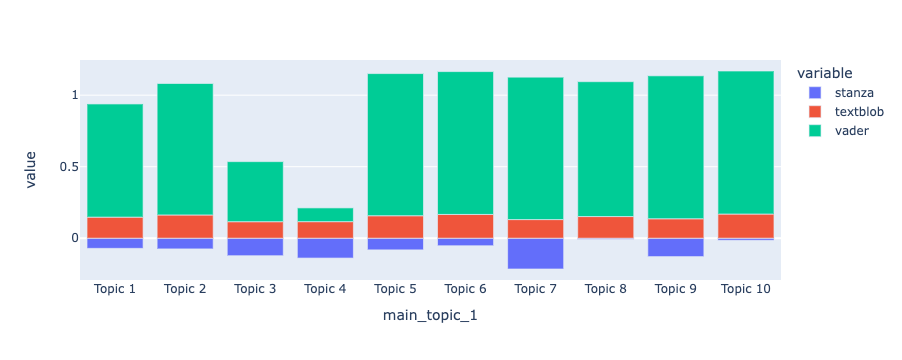

In [9]:
fig = px.bar(sa_topic, y= ['stanza', 'textblob', 'vader']) #Stanza = more negative
fig.show()

# Sentiment per sentence (LDA)

There seems to exist some variability in the sentiment levels across the topics. However, with the textblob sentiment scores, it is hard to tell which topic has more positive/negative sentiments than others. And, albeit varying, the stanza scores appear to be all negative, whereas vader results in all positive scores. 

Taking this into account, we inspect sentiment per sentiment for each topic and look at the variance of the sentiment scores within a speech.

## Select One Speech per Topic

As we want to visually demonstrate the evolution of sentiment scores throughout the script for each type of topics, we decided to randomly select one speech per topic.

In [24]:
# Looking up what titles appear on top for each topic (1:10)
# df[df['main_topic_1'] == 'Topic 4']

After having looked at the titles of speeches for each topic, we decided to use the following as samples to look into the variance of the sentiment scores. The number after each title is their corresponding index number.

<br> In the order of Topic 1 - Topic 10:
* 'Prayer_Breakfast_2016' 0 
* 'Elena_Kagan_USSC_Nomination' 44
* 'NW_Flight_253_Update' 17
* 'Umpqua_Community_College_Shootings' 3 
* 'White_House_Correspondent_Dinner_2013' 4
* 'Senate_Floor_Immigration_Reform' 6
* 'Border_Security_and_Immigration_Reform' 5
* 'Security_Team_Announcement' 1
* 'UN_Copenhagen_Climate_Change' 8 
* 'India_Speech_at_New_Delhi' 10

## Sentiment per Sentence

In [10]:
# Taking only 1 speech per topic
df3 = df.loc[[0, 44, 17, 3, 4, 6, 5, 1, 8, 10], ]
df3.index = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']
df3

,title,date,stanza,textblob,vader,subjectivity,pages,location,highest_speaker_count,content,...,main_topic_6,main_topic_6_perc,main_topic_7,main_topic_7_perc,main_topic_8,main_topic_8_perc,main_topic_9,main_topic_9_perc,main_topic_10,main_topic_10_perc
Topic 1,Prayer_Breakfast_2016,2016-02-04,0.099,0.178,1.000,0.542,7,"Washington Hilton, Washington D.C.",0,"Well, good morning. Giving all praise and hono...",...,Topic 6,0.013213,Topic 2,0.013213,Topic 3,0.013213,Topic 10,0.013213,Topic 7,0.013213
Topic 2,Elena_Kagan_USSC_Nomination,2010-05-10,0.277,0.268,1.000,0.499,3,unknown_location,0,"Thank you very much. Everybody, please have a ...",...,Topic 6,0.027631,Topic 10,0.027630,Topic 7,0.027629,Topic 9,0.027629,Topic 3,0.027629
Topic 3,NW_Flight_253_Update,2009-12-29,-0.054,0.109,0.995,0.461,3,"Kaneohe Bay Marine Base, Kaneohe, Hawaii",0,Good morning. Yesterday I updated the American...,...,Topic 5,0.035727,Topic 6,0.035726,Topic 4,0.035724,Topic 9,0.035724,Topic 10,0.035721
Topic 4,Umpqua_Community_College_Shootings,2015-10-01,-0.250,0.061,-0.998,0.435,4,Washington D.C.,0,There's been another mass shooting in America ...,...,Topic 1,0.027939,Topic 5,0.027939,Topic 6,0.027939,Topic 10,0.027938,Topic 9,0.027937
Topic 5,White_House_Correspondent_Dinner_2013,2013-04-27,-0.012,0.145,1.000,0.501,6,"Washington Hilton Hotel, Washington D.C.",0,"Thank you. Thank you, everybody. How do you li...",...,Topic 2,0.019500,Topic 7,0.019499,Topic 3,0.019498,Topic 10,0.019497,Topic 9,0.019497
Topic 6,Senate_Floor_Immigration_Reform,2007-05-23,-0.118,0.086,0.998,0.466,5,Washington D.C.,0,"Mr. President, Last year I spoke1 at one of th...",...,Topic 9,0.022480,Topic 10,0.022479,Topic 2,0.022479,Topic 3,0.022477,Topic 8,0.022477
Topic 7,Border_Security_and_Immigration_Reform,2014-06-30,-0.177,0.145,0.999,0.436,5,unknown_location,0,"Good afternoon, everybody. One year ago this m...",...,Topic 8,3.131348,Topic 2,0.018628,Topic 1,0.018627,Topic 10,0.018626,Topic 9,0.018626
Topic 8,Security_Team_Announcement,2008-12-01,0.140,0.162,0.998,0.403,5,"Chicago, Illinois",0,"Good morning, everybody. I hope you all had a ...",...,Topic 6,3.309813,Topic 5,0.015630,Topic 1,0.015629,Topic 4,0.015629,Topic 7,0.015629
Topic 9,UN_Copenhagen_Climate_Change,2009-12-18,-0.090,0.140,1.000,0.411,3,"Copenhagen, Denmark",0,Good morning. It is an honor for me to join th...,...,Topic 10,0.030130,Topic 8,0.030129,Topic 2,0.030128,Topic 3,0.030128,Topic 4,0.030127
Topic 10,India_Speech_at_New_Delhi,2015-01-27,0.086,0.208,1.000,0.487,9,"Siri Fort Auditorium, New Delhi, India",0,"Thank you so much. Thank you so much, Neha, fo...",...,Topic 9,0.008093,Topic 4,0.008093,Topic 2,0.008092,Topic 7,0.008092,Topic 3,0.008092


In [11]:
# Test how to apply a function in a pandas dataframe and not break stuff (check cell 2 for context)
def clean_txt(string):
    string = string.replace(" -- ", ", ")
    return string

## This is to replace the content column in pandas
## Pandas is stupid and has issues with naming things with the same variable name
a = df3["content"].map(lambda x: clean_txt(x))
a = a.to_list()
df3 = df3.assign(content = a)

In [12]:
# Apply the sentiment model function to all content and get a score dataframe
cont_save = df3["content"].to_list()
stop = len(cont_save)       # Change this to use all dataset

In [13]:
Speeches = []
for i in range(stop):
    tb_speech = TextBlob(cont_save[i])
    Speeches.append(tb_speech)
    
Speeches[0]

TextBlob("Well, good morning. Giving all praise and honor to God for bringing us together here this morning. I want to thank everyone who helped organize this breakfast, especially our co-chairs, Robert and Juan, who embody the tradition of friendship, fellowship, and prayer. I will begin with a confession: I have always felt a tinge of guilt motorcading up here at the heart of D.C.'s rush hour. I suspect that not all the commuters were blessing me as they waited to get to work. But it's for a good cause. A National Prayer Brunch doesn't have the same ring to it. And Michelle and I are extremely honored, as always, to be with so many friends, with members of Congress, with faith leaders from across the country and around the world, to be with the Speaker, Leader. I want thank Mark and Roma for their friendship and their extraordinary story, and sharing those inspiring words. Andre, for sharing his remarkable gifts. And on this occasion, I always enjoy reflecting on a piece of scripture

In [14]:
Polarity=[]
for speech in Speeches:
    tb_sa = []
    for sentence in speech.sentences:
        pol= sentence.sentiment.polarity
        tb_sa.append(pol)
    Polarity.append(tb_sa)
# print(Polarity)

PolarityPerSent = pd.DataFrame(Polarity)
PolarityPerSent = PolarityPerSent.transpose()
PolarityPerSent.columns = ['Topic 1', 'Topic 2', 'Topic 3', 'Topic 4', 'Topic 5', 'Topic 6', 'Topic 7', 'Topic 8', 'Topic 9', 'Topic 10']
PolarityPerSent["id"] = PolarityPerSent.index 
PolarityPerSent

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,id
0,0.7,0.260000,0.70,0.000000,0.000000,0.0,0.7,0.700000,0.7,0.2,0
1,0.0,0.000000,0.25,0.250000,0.000000,0.0,0.0,1.000000,0.0,0.6,1
2,0.0,0.700000,-0.25,-0.166667,0.136364,0.0,0.0,0.133333,0.0,0.0,2
3,0.0,0.193333,0.00,0.000000,0.000000,0.0,0.0,0.500000,0.2,0.5,3
4,0.0,0.100000,0.00,0.700000,-0.187500,0.5,0.0,0.200000,0.0,1.0,4
...,...,...,...,...,...,...,...,...,...,...,...
250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,250
251,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,251
252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,252
253,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,253


### Distributions

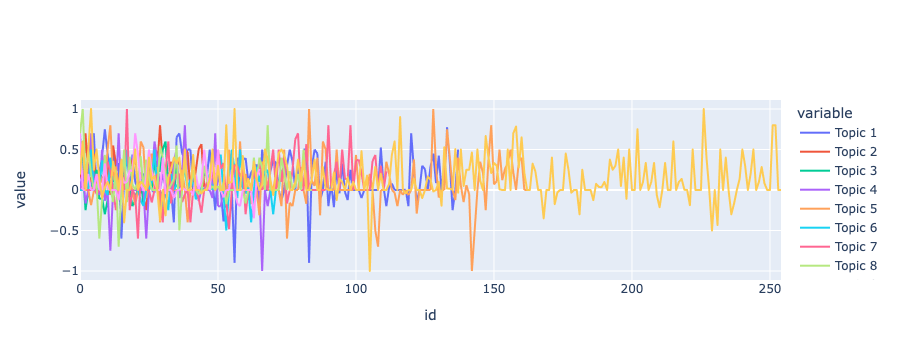

In [15]:
PPS = PolarityPerSent.melt(id_vars="id") # from a wide table to a long table

fig = px.line(PPS, x="id", y = 'value', color = 'variable', title=' ')
fig.show()

Again, recall that although the variables are named after the topics each selected speech associated with, they do not represent the topics. 

### Box plot + scatter for each topic

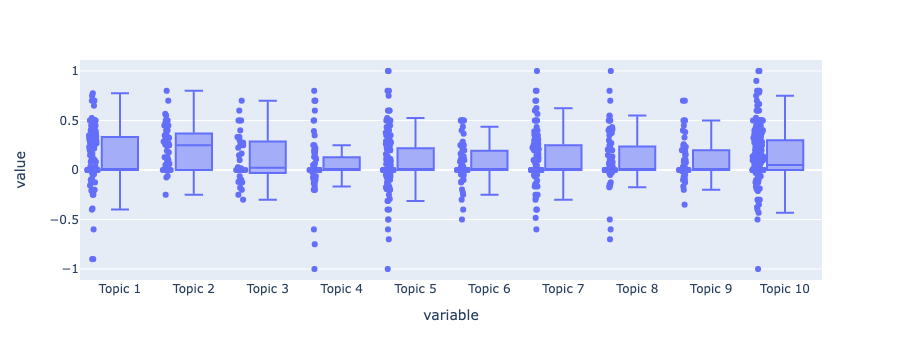

In [16]:
fig = px.box(PPS, x="variable", y="value", points="all")
fig.show()

### Variance

In [17]:
PolarityPerSent.var(skipna=True, numeric_only=None)
# ddof=0 can be set to normalize by N instead of N-1

Topic 1        0.080148
Topic 2        0.050218
Topic 3        0.062457
Topic 4        0.079134
Topic 5        0.077467
Topic 6        0.041206
Topic 7        0.069500
Topic 8        0.068235
Topic 9        0.039273
Topic 10       0.068921
id          5440.000000
dtype: float64

### Mean Difference (document-wise vs. sentence-wise)

In [18]:
sent_mean = pd.DataFrame(np.mean(PolarityPerSent)[0:10])
diff = sent_mean[0] - df3['textblob'] # comparison with document-wise score for each speech
diff

Topic 1    -0.046559
Topic 2    -0.045530
Topic 3     0.014259
Topic 4    -0.011232
Topic 5    -0.062895
Topic 6    -0.014970
Topic 7    -0.031638
Topic 8    -0.051224
Topic 9    -0.043844
Topic 10   -0.060668
dtype: float64

We see that in 9 out of 10 speeches the sentence-wise sentiment analysis results in a slightly more positive score than the document-wise sentiment analysis. Nonetheless, the differences are rather small. 

In [19]:
# Comparison with the document-wise **mean** score for each topic
diff = sent_mean[0] - sa_topic['textblob']
diff

Topic 1    -0.015853
Topic 2     0.060016
Topic 3     0.007845
Topic 4    -0.065875
Topic 5    -0.074927
Topic 6    -0.095085
Topic 7    -0.016811
Topic 8    -0.040569
Topic 9    -0.039686
Topic 10   -0.021613
dtype: float64

Most speeches that were randomly selected to represent a topic have larger sentence-wise mean score than the average document-wise score for the corresponding topic. To clarify, `sa_topic['textblob']` consits of 10 values each of which is an average of document-wise sentiment scores of the speeches that belong to a topic group.

# Topic (NMF) + Sentiment

In [20]:
df4 = pd.read_csv(csv_path / "topic_classification.txt")
df4

,title,main_topic_1_index,main_topic_1_weigth,main_topic_2_index,main_topic_2_weigth,main_topic_3_index,main_topic_3_weigth,main_topic_4_index,main_topic_4_weigth,main_topic_5_index,...,main_topic_21_index,main_topic_21_weigth,main_topic_22_index,main_topic_22_weigth,main_topic_23_index,main_topic_23_weigth,main_topic_24_index,main_topic_24_weigth,main_topic_25_index,main_topic_25_weigth
0,CGI_2013,4,0.413642,1,0.032632113517595006,10,0.002403376684091891,19,0.002039285396823799,5,...,none,none,none,none,none,none,none,none,none,none
1,Prayer_Breakfast_2016,20,0.254319,21,0.13874539443627698,0,0.017418105723654678,19,0.011856259805532956,11,...,none,none,none,none,none,none,none,none,none,none
2,Security_Team_Announcement,9,0.147426,8,0.09588333619120101,7,0.04684129255216229,10,0.03915738124534947,22,...,none,none,none,none,none,none,none,none,none,none
3,Cairo_University,21,0.419471,11,0.13660177640347296,7,0.049827558347054775,8,0.03659511830870309,2,...,none,none,none,none,none,none,none,none,none,none
4,Umpqua_Community_College_Shootings,6,0.299799,9,0.028849921936287493,20,0.0227824245586038,10,0.008612726270147837,19,...,none,none,none,none,none,none,none,none,none,none
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431,ASEAN_Business_2015,15,0.353722,17,0.009991376062640988,24,0.007863959454890148,8,0.006304663260627828,1,...,none,none,none,none,none,none,none,none,none,none
432,Finance_Crisis_Fee,18,0.464044,none,none,none,none,none,none,none,...,none,none,none,none,none,none,none,none,none,none
433,YLAI_Town_Hall,12,0.120933,22,0.09597629840127073,11,0.08352099527242964,19,0.0722515124548327,14,...,none,none,none,none,none,none,none,none,none,none
434,Oval_Office_Counter_Terrorism_Agenda,3,0.272539,21,0.1733511474385276,9,0.11217609301118954,6,0.02803049073108576,8,...,none,none,none,none,none,none,none,none,none,none


In [21]:
df_nmf = pd.merge(df1, df4, how = "inner", on= "title") #df1 from Section 1.2
df_nmf = df_nmf.iloc[:, 0:8]
df_nmf['weighted'] = df_nmf['subjectivity']*df_nmf['vader']
df_nmf

,title,date,stanza,textblob,vader,subjectivity,main_topic_1_index,main_topic_1_weigth,weighted
0,Prayer_Breakfast_2016,2016-02-04,0.099,0.178,1.000,0.542,20,0.254319,0.542000
1,Security_Team_Announcement,2008-12-01,0.140,0.162,0.998,0.403,9,0.147426,0.402194
2,Cairo_University,2009-06-04,-0.150,0.110,1.000,0.457,21,0.419471,0.457000
3,Umpqua_Community_College_Shootings,2015-10-01,-0.250,0.061,-0.998,0.435,6,0.299799,-0.434130
4,White_House_Correspondent_Dinner_2013,2013-04-27,-0.012,0.145,1.000,0.501,22,0.326769,0.501000
...,...,...,...,...,...,...,...,...,...
341,Shimon_Peres_Memorial,2016-09-30,-0.083,0.164,1.000,0.436,11,0.275599,0.436000
342,ASEAN_Business_2015,2015-11-21,-0.050,0.164,1.000,0.399,15,0.353722,0.399000
343,Finance_Crisis_Fee,2010-01-14,-0.412,0.080,0.987,0.436,18,0.464044,0.430332
344,Oval_Office_Counter_Terrorism_Agenda,2015-12-06,-0.134,0.076,-1.000,0.398,3,0.272539,-0.398000


In [22]:
sa_topic_nmf = df_nmf.groupby('main_topic_1_index').mean()
sa_topic_nmf = sa_topic_nmf[['stanza', 'textblob', 'vader', 'subjectivity', 'weighted']]
sa_topic_nmf = sa_topic_nmf.set_axis(['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 
                                     'Topic 9', 'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15', 
                                     'Topic 16', 'Topic 17', 'Topic 18', 'Topic 19', 'Topic 20', 'Topic 21', 'Topic 22', 
                                     'Topic 23', 'Topic 24', 'Topic 25'], axis=0) #axis=0 means rows 
sa_topic_nmf

,stanza,textblob,vader,subjectivity,weighted
Topic 1,-0.122150,0.129350,0.877500,0.481100,0.427267
Topic 2,-0.225000,0.132750,0.993875,0.447062,0.444186
Topic 3,-0.188636,0.126182,0.930000,0.463000,0.427336
Topic 4,-0.124000,0.098000,-0.168083,0.427833,-0.064523
Topic 5,-0.184538,0.145769,0.999462,0.466231,0.465994
Topic 6,-0.109818,0.147000,0.999091,0.455545,0.455116
Topic 7,-0.172714,0.108714,-0.707714,0.459000,-0.320076
Topic 8,-0.029778,0.150778,0.886944,0.478333,0.419417
Topic 9,-0.005231,0.147077,0.877962,0.459962,0.407481
Topic 10,-0.072238,0.139286,0.890762,0.469095,0.414806


## Bar chart: Sentiment per Topic

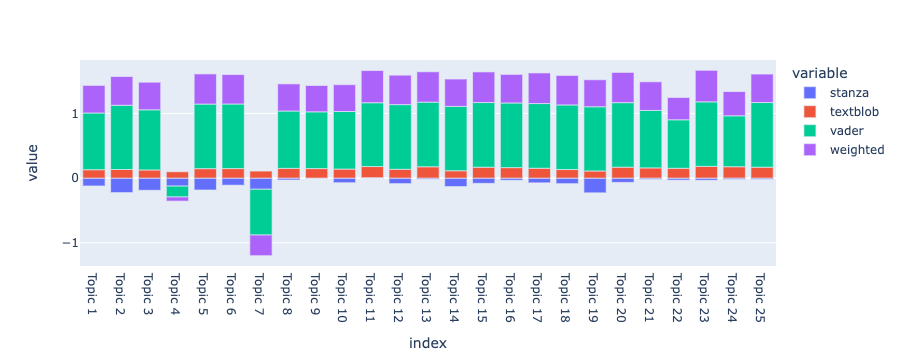

In [23]:
fig = px.bar(sa_topic_nmf, y= ['stanza', 'textblob', 'vader', 'weighted']) # add weighted version
fig.show()

* Topic 4: health_care
* Topic7: memorial--war--peace--freedom--democracy


# Sentiment per Sentence (NMF)

We again look into the variation of the sentiment scores across the speeches. But now, we are running the sentence-wise sentiment analysis for all the speeches. And, we use the topic classification produced by NMF algorithm instead of LDA.  

We check this because given the nature of many political speeches, we assume that Obama's speeches must be somehow neutralized throughout a speech. This is to say that more extreme points may exist within a speech but when we account for a document-wise sentiment score they are not visible since they are cancelled by other sentences or neutralized. Therefore, if there is more variation within a speech, there may exist more extreme points within it and we can gather more insights about the sentiments of those speeches.

In [65]:
# Check if you still have df. Otherwise, go to Section 2.

dtype('O')

In [24]:
# Test how to apply a function in a pandas dataframe and not break stuff (check cell 2 for context)
def clean_txt(string):
    string = string.replace(" -- ", ", ")
    return string

## This is to replace the content column in pandas
a = df["content"].map(lambda x: clean_txt(x))
a = a.to_list()
df = df.assign(content = a)

cont_save = df["content"].to_list()
stop = len(cont_save)  

In [25]:
Speeches_all = []
for i in range(stop):
    tb_speech = TextBlob(cont_save[i])
    Speeches_all.append(tb_speech)

In [26]:
Polarity=[]
for speech in Speeches_all:
    tb_sa = []
    for sentence in speech.sentences:
        pol= sentence.sentiment.polarity
        tb_sa.append(pol)
    Polarity.append(tb_sa)
# print(Polarity)

PolarityPerSent = pd.DataFrame(Polarity)
PolarityPerSent["title"] = df["title"]
PolarityPerSent

,0,1,2,3,4,5,6,7,8,9,...,423,424,425,426,427,428,429,430,431,title
0,0.700000,0.00,0.000000,0.000000,0.00000,0.700000,0.000000,0.187500,0.416667,0.750000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Prayer_Breakfast_2016
1,0.700000,1.00,0.133333,0.500000,0.20000,0.000000,0.078788,-0.600000,-0.125000,0.433333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Security_Team_Announcement
2,0.200000,0.70,0.750000,0.000000,0.00000,0.000000,0.400000,0.266667,0.000000,0.200000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cairo_University
3,0.000000,0.25,-0.166667,0.000000,0.70000,0.125000,0.133333,-0.063889,0.500000,-0.133333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Umpqua_Community_College_Shootings
4,0.000000,0.00,0.136364,0.000000,-0.18750,-0.017045,0.104167,0.222222,0.111111,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White_House_Correspondent_Dinner_2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,0.500000,0.40,0.400000,0.350000,0.00000,0.000000,0.000000,0.150000,0.000000,0.300000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Shimon_Peres_Memorial
342,0.200000,0.00,0.700000,-0.275000,0.30000,-1.000000,-0.100000,0.484091,0.600000,0.600000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ASEAN_Business_2015
343,0.000000,0.00,0.100000,0.225000,0.15625,-0.166667,0.000000,0.000000,0.000000,0.178571,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Finance_Crisis_Fee
344,0.700000,-0.20,0.350000,-0.055556,0.00000,0.500000,0.000000,-0.875000,0.100000,-0.068519,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oval_Office_Counter_Terrorism_Agenda


In [27]:
df_ssnmf = pd.merge(PolarityPerSent, df_nmf, how = "inner", on= "title") 
df_ssnmf.rename(columns = {'main_topic_1_index': 'topic'}, inplace=True)
df_ssnmf

,0,1,2,3,4,5,6,7,8,9,...,431,title,date,stanza,textblob,vader,subjectivity,topic,main_topic_1_weigth,weighted
0,0.700000,0.00,0.000000,0.000000,0.00000,0.700000,0.000000,0.187500,0.416667,0.750000,...,NaN,Prayer_Breakfast_2016,2016-02-04,0.099,0.178,1.000,0.542,20,0.254319,0.542000
1,0.700000,1.00,0.133333,0.500000,0.20000,0.000000,0.078788,-0.600000,-0.125000,0.433333,...,NaN,Security_Team_Announcement,2008-12-01,0.140,0.162,0.998,0.403,9,0.147426,0.402194
2,0.200000,0.70,0.750000,0.000000,0.00000,0.000000,0.400000,0.266667,0.000000,0.200000,...,NaN,Cairo_University,2009-06-04,-0.150,0.110,1.000,0.457,21,0.419471,0.457000
3,0.000000,0.25,-0.166667,0.000000,0.70000,0.125000,0.133333,-0.063889,0.500000,-0.133333,...,NaN,Umpqua_Community_College_Shootings,2015-10-01,-0.250,0.061,-0.998,0.435,6,0.299799,-0.434130
4,0.000000,0.00,0.136364,0.000000,-0.18750,-0.017045,0.104167,0.222222,0.111111,0.000000,...,NaN,White_House_Correspondent_Dinner_2013,2013-04-27,-0.012,0.145,1.000,0.501,22,0.326769,0.501000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,0.500000,0.40,0.400000,0.350000,0.00000,0.000000,0.000000,0.150000,0.000000,0.300000,...,NaN,Shimon_Peres_Memorial,2016-09-30,-0.083,0.164,1.000,0.436,11,0.275599,0.436000
342,0.200000,0.00,0.700000,-0.275000,0.30000,-1.000000,-0.100000,0.484091,0.600000,0.600000,...,NaN,ASEAN_Business_2015,2015-11-21,-0.050,0.164,1.000,0.399,15,0.353722,0.399000
343,0.000000,0.00,0.100000,0.225000,0.15625,-0.166667,0.000000,0.000000,0.000000,0.178571,...,NaN,Finance_Crisis_Fee,2010-01-14,-0.412,0.080,0.987,0.436,18,0.464044,0.430332
344,0.700000,-0.20,0.350000,-0.055556,0.00000,0.500000,0.000000,-0.875000,0.100000,-0.068519,...,NaN,Oval_Office_Counter_Terrorism_Agenda,2015-12-06,-0.134,0.076,-1.000,0.398,3,0.272539,-0.398000


### Saving df_ssnmf.csv

In [28]:
# Save
df_ssnmf.to_csv(csv_path / "df_ssnmf.csv", index=False) # Backup

In [29]:
# Read the data
df_ssnmf = pd.read_csv(csv_path / "df_ssnmf.csv", infer_datetime_format = True, parse_dates = ["date"])

In [30]:
df_ssnmf['topic'].value_counts()

20    35
22    31
8     26
9     21
14    21
0     20
7     18
1     16
18    14
4     13
3     12
19    11
2     11
5     11
11    11
13    10
23     9
15     8
17     8
24     8
21     8
6      7
12     6
16     6
10     5
Name: topic, dtype: int64

## Sentence Mean & Variance

In [31]:
df_ssnmf['sent_var'] = df_ssnmf.iloc[:, 0:432].var(axis=1)
df_ssnmf['sent_mean'] = df_ssnmf.iloc[:, 0:432].mean(axis=1)
df_ssnmf

,0,1,2,3,4,5,6,7,8,9,...,date,stanza,textblob,vader,subjectivity,topic,main_topic_1_weigth,weighted,sent_var,sent_mean
0,0.700000,0.00,0.000000,0.000000,0.00000,0.700000,0.000000,0.187500,0.416667,0.750000,...,2016-02-04,0.099,0.178,1.000,0.542,20,0.254319,0.542000,0.080148,0.131441
1,0.700000,1.00,0.133333,0.500000,0.20000,0.000000,0.078788,-0.600000,-0.125000,0.433333,...,2008-12-01,0.140,0.162,0.998,0.403,9,0.147426,0.402194,0.068235,0.110776
2,0.200000,0.70,0.750000,0.000000,0.00000,0.000000,0.400000,0.266667,0.000000,0.200000,...,2009-06-04,-0.150,0.110,1.000,0.457,21,0.419471,0.457000,0.061398,0.083791
3,0.000000,0.25,-0.166667,0.000000,0.70000,0.125000,0.133333,-0.063889,0.500000,-0.133333,...,2015-10-01,-0.250,0.061,-0.998,0.435,6,0.299799,-0.434130,0.079134,0.049768
4,0.000000,0.00,0.136364,0.000000,-0.18750,-0.017045,0.104167,0.222222,0.111111,0.000000,...,2013-04-27,-0.012,0.145,1.000,0.501,22,0.326769,0.501000,0.077467,0.082105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,0.500000,0.40,0.400000,0.350000,0.00000,0.000000,0.000000,0.150000,0.000000,0.300000,...,2016-09-30,-0.083,0.164,1.000,0.436,11,0.275599,0.436000,0.057207,0.119673
342,0.200000,0.00,0.700000,-0.275000,0.30000,-1.000000,-0.100000,0.484091,0.600000,0.600000,...,2015-11-21,-0.050,0.164,1.000,0.399,15,0.353722,0.399000,0.055890,0.117930
343,0.000000,0.00,0.100000,0.225000,0.15625,-0.166667,0.000000,0.000000,0.000000,0.178571,...,2010-01-14,-0.412,0.080,0.987,0.436,18,0.464044,0.430332,0.025720,0.041790
344,0.700000,-0.20,0.350000,-0.055556,0.00000,0.500000,0.000000,-0.875000,0.100000,-0.068519,...,2015-12-06,-0.134,0.076,-1.000,0.398,3,0.272539,-0.398000,0.064070,0.045331


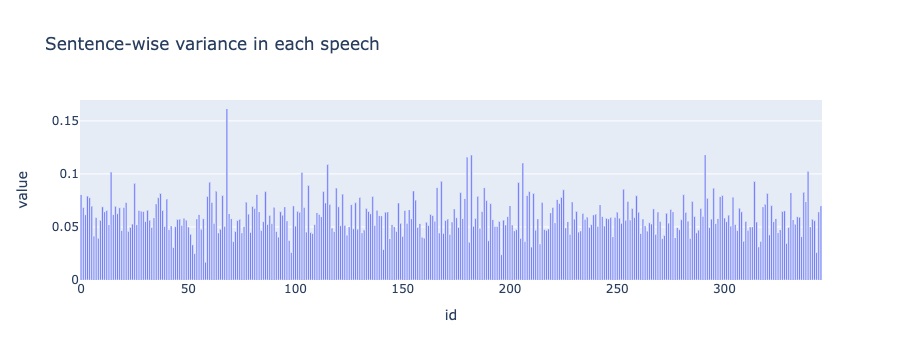

In [32]:
df_ssnmf['id'] = df_ssnmf.index # Creating id column

PPS =  df_ssnmf[['id', 'sent_var']]
PPS = PPS.melt(id_vars="id") # from a wide table to a long table

fig = px.bar(PPS, x="id", y = 'value',  title='Sentence-wise variance in each speech')
fig.show()

In [33]:
print(f"The number of speeches with large variance is {len(df_ssnmf[df_ssnmf['sent_var'] > 0.1])}")
print(df_ssnmf[df_ssnmf['sent_var'] > 0.1].title)

The number of speeches with large variance is 9
14                               Prayer_Breakfast_2014
68                        Benghazi_Attacks_Rose_Garden
103                         911_Pentagon_Memorial_2010
115           Boston_Marathon_Bombing_Second_Statement
180                        Orlando_Shootings_Statement
182                                  Orlando_Community
206    First_Meeting_with_President_Elect_Donald_Trump
291                                   Lincoln_Memorial
339            Boston_Marathon_Bombing_Third_Statement
Name: title, dtype: object


In [34]:
# Mean Difference between the sentence-wise and document-wise textblob scores
diff = df_ssnmf[abs(df_ssnmf['sent_mean'] - df_ssnmf['textblob']) > 0.09]
print(f"The number of speeches with large difference between the sentence-wise and the document-wise sentiment analysis is: {len(diff)}")
diff['title']

The number of speeches with large difference between the sentence-wise and the document-wise sentiment analysis is: 7


115    Boston_Marathon_Bombing_Second_Statement
120                       Dorothy_Height_Eulogy
168                      Antonin_Scalia_Passing
196            Farewell_to_Staff_and_Supporters
200        Holy_Cross_Interfaith_Prayer_Service
204                 Hillary_Clinton_Endorsement
270                   Iraq_Multinational_Troops
Name: title, dtype: object

## Bar chart: Sentence-wise Score Mean & Variance per Topic

To see which topic has a large variation, we can aggregate the results of the speeches for each topic they associate the most with. However, it should be noted that this is a rudimentary way to compare the mean and the variance per topic and the results we see in the following plots cannot determine our conclusions about the speeches/topics. We recognize the correlations between sentences and between speeches, which can influence the comparison. To account for this issue, we need to conduct a **Mixed Model** which is presented in a separate notebook.

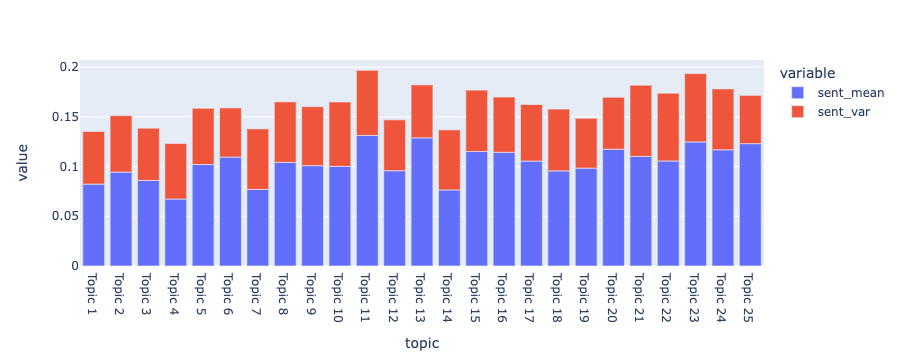

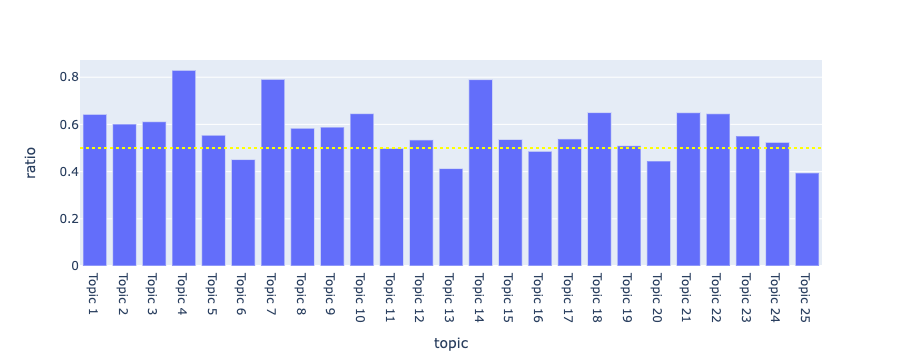

In [35]:
group = df_ssnmf.groupby('topic').mean()
group['topic'] = ['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 
                                     'Topic 9', 'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15', 
                                     'Topic 16', 'Topic 17', 'Topic 18', 'Topic 19', 'Topic 20', 'Topic 21', 'Topic 22', 
                                     'Topic 23', 'Topic 24', 'Topic 25']

fig = px.bar(group, x='topic', y= ['sent_mean', 'sent_var'] )
fig.show()

group['ratio'] = group['sent_var']/group['sent_mean']
fig2 = px.bar(group, x='topic', y= 'ratio')
fig2.add_hline(y=0.5, line_width=2, line_dash="dot", line_color="yellow")
fig2.show()

## Distributions per Topic

In [36]:
df_ssnmf2 = pd.melt(df_ssnmf, id_vars = ['id', 'topic'], value_vars = df_ssnmf.iloc[:, 0:432])
df_ssnmf2

,id,topic,variable,value
0,0,20,0,0.7
1,1,9,0,0.7
2,2,21,0,0.2
3,3,6,0,0.0
4,4,22,0,0.0
...,...,...,...,...
149467,341,11,431,NaN
149468,342,15,431,NaN
149469,343,18,431,NaN
149470,344,3,431,NaN


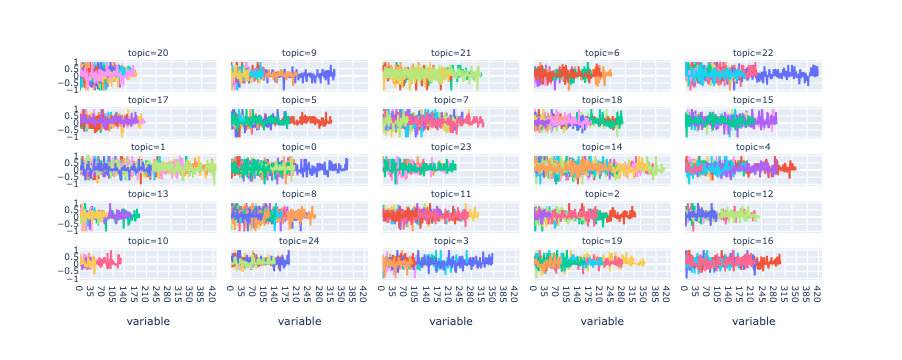

In [37]:
# Dash: https://plotly.com/python/facet-plots/

fig = px.line(df_ssnmf2, x ='variable', y='value', color= 'id', facet_col = 'topic', facet_col_wrap = 5, 
              labels = {'value': ''} )
fig.update_layout(showlegend=False,
                  font=dict(size=9))
fig.show()

# Topic & Sentiment per Quarter

In [38]:
df_ssnmf.head() # check, if abnormal go to section 5.0.1 and reload

,0,1,2,3,4,5,6,7,8,9,...,stanza,textblob,vader,subjectivity,topic,main_topic_1_weigth,weighted,sent_var,sent_mean,id
0,0.7,0.00,0.000000,0.0,0.0000,0.700000,0.000000,0.187500,0.416667,0.750000,...,0.099,0.178,1.000,0.542,20,0.254319,0.542000,0.080148,0.131441,0
1,0.7,1.00,0.133333,0.5,0.2000,0.000000,0.078788,-0.600000,-0.125000,0.433333,...,0.140,0.162,0.998,0.403,9,0.147426,0.402194,0.068235,0.110776,1
2,0.2,0.70,0.750000,0.0,0.0000,0.000000,0.400000,0.266667,0.000000,0.200000,...,-0.150,0.110,1.000,0.457,21,0.419471,0.457000,0.061398,0.083791,2
3,0.0,0.25,-0.166667,0.0,0.7000,0.125000,0.133333,-0.063889,0.500000,-0.133333,...,-0.250,0.061,-0.998,0.435,6,0.299799,-0.434130,0.079134,0.049768,3
4,0.0,0.00,0.136364,0.0,-0.1875,-0.017045,0.104167,0.222222,0.111111,0.000000,...,-0.012,0.145,1.000,0.501,22,0.326769,0.501000,0.077467,0.082105,4


In [39]:
# using the to_period function
df_ssnmf['topic'] = df_ssnmf['topic'].replace([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24],
                                                                        ['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 'Topic 9', 
                                                                         'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15','Topic 16', 'Topic 17', 
                                                                         'Topic 18', 'Topic 19', 'Topic 20', 'Topic 21', 'Topic 22', 'Topic 23', 'Topic 24', 'Topic 25'])
df_ssnmf['quarter'] = df_ssnmf['date'].dt.to_period('Q').dt.strftime('%Y Q%q ') #Plotly doesn't like the outputs from df_ssnmf['date'].dt.to_period
df_ssnmf['quarter']


0      2016 Q1 
1      2008 Q4 
2      2009 Q2 
3      2015 Q4 
4      2013 Q2 
         ...   
341    2016 Q3 
342    2015 Q4 
343    2010 Q1 
344    2015 Q4 
345    2010 Q2 
Name: quarter, Length: 346, dtype: object

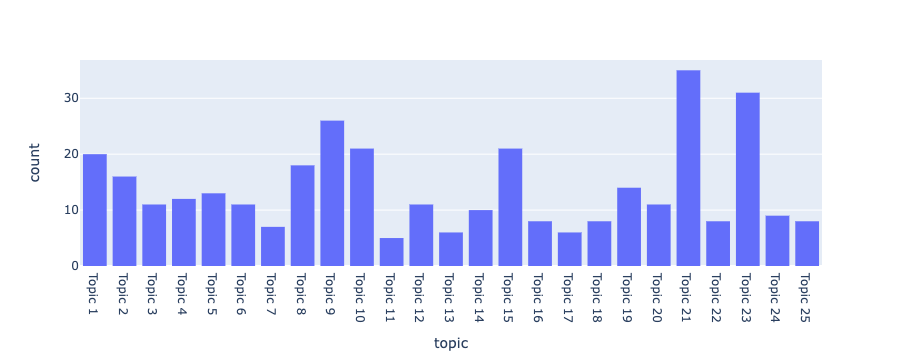

In [40]:
fig = px.histogram(df_ssnmf, x="topic",  
                   category_orders= {'topic' :['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 'Topic 9', 
                                                'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15','Topic 16', 'Topic 17', 
                                                 'Topic 18', 'Topic 19', 'Topic 20', 'Topic 21', 'Topic 22', 'Topic 23', 'Topic 24', 'Topic 25'] })
fig.show()

* Topic 21: Faith-Family 
* Topic 23: Election
* Topic 9: Iraq-Afghanistan-War

In [41]:
dummies = pd.get_dummies(df_ssnmf['topic'])
dummies['id'] = dummies.index

In [42]:
q_df = df_ssnmf.loc[:,['quarter', 'id']]
q_df = pd.merge(q_df, dummies, how='inner', on='id')

Now I need to make a summary table to see the information per quarter.

In [43]:
q_df_sum = q_df.groupby('quarter').sum()
q_df_sum['quarter2'] = q_df_sum.index
q_df_sum['quarter2'].dtype

dtype('O')

In [44]:
q_df_sum = q_df_sum.drop(columns='id')
q_df_sum

,Topic 1,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16,Topic 17,Topic 18,...,Topic 24,Topic 25,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,quarter2
quarter,,,,,,,,,,,,,,,,,,,,,
2004 Q3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2004 Q3
2005 Q1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2005 Q1
2005 Q2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,2005 Q2
2005 Q4,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2005 Q4
2006 Q1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2006 Q1
2006 Q3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2006 Q3
2007 Q1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,2007 Q1
2007 Q2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,2007 Q2
2007 Q4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2007 Q4


In [45]:
q_df_sum_long = q_df_sum.melt(id_vars = 'quarter2', value_vars = ['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 'Topic 9', 
                                                'Topic 10', 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15','Topic 16', 'Topic 17', 
                                                 'Topic 18', 'Topic 19', 'Topic 20', 'Topic 21', 'Topic 22', 'Topic 23', 'Topic 24', 'Topic 25'])
q_df_sum_long

,quarter2,variable,value
0,2004 Q3,Topic 1,0
1,2005 Q1,Topic 1,0
2,2005 Q2,Topic 1,0
3,2005 Q4,Topic 1,1
4,2006 Q1,Topic 1,1
...,...,...,...
1145,2016 Q1,Topic 25,0
1146,2016 Q2,Topic 25,0
1147,2016 Q3,Topic 25,0
1148,2016 Q4,Topic 25,0


## Bar chart: Topics per Quarter

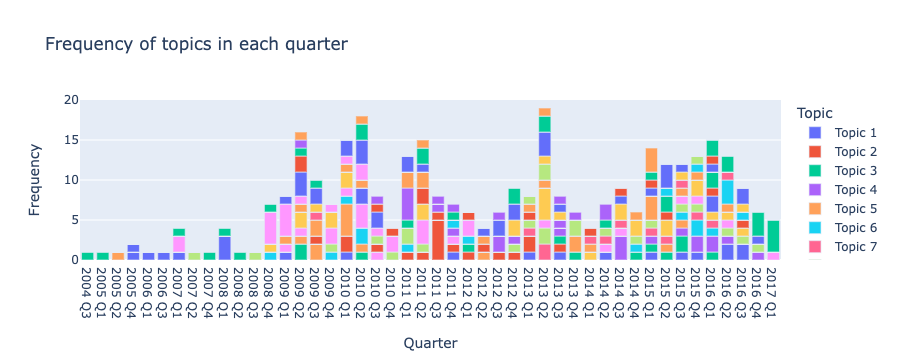

In [46]:
fig = px.bar(q_df_sum_long, x='quarter2', y = 'value', color = 'variable',
            labels={'quarter2': 'Quarter',
                    'value': 'Frequency',
                   'variable': 'Topic'},
            title = "Frequency of topics in each quarter")

fig.show()

## Bar chart: Top occurring topics per quarter

In [47]:
q_df_mode = q_df_sum_long.groupby(['quarter2']).max('value')
q_df_mode.shape

(46, 1)

In [48]:
q_df_mode2 = pd.merge(q_df_mode, q_df_sum_long, how='inner', on=["quarter2", "value"])
q_df_mode2

,quarter2,value,variable
0,2004 Q3,1,Topic 23
1,2005 Q1,1,Topic 23
2,2005 Q2,1,Topic 15
3,2005 Q4,1,Topic 1
4,2005 Q4,1,Topic 11
...,...,...,...
76,2016 Q2,3,Topic 16
77,2016 Q3,2,Topic 1
78,2016 Q3,2,Topic 21
79,2016 Q4,3,Topic 23


In [49]:
# print(px.colors.qualitative.Light24)

topics = ['Topic 1','Topic 2','Topic 3','Topic 4','Topic 5','Topic 6','Topic 7','Topic 8', 'Topic 9', 'Topic 10', 
 'Topic 11', 'Topic 12', 'Topic 13', 'Topic 14', 'Topic 15','Topic 16', 'Topic 17', 'Topic 18', 'Topic 19', 'Topic 20', 
 'Topic 21', 'Topic 22', 'Topic 23', 'Topic 24', 'Topic 25']

colors={'Topic 1': '#FD3216', 'Topic 2': '#00FE35', 'Topic 3': '#6A76FC', 'Topic 4': '#FED4C4', 'Topic 5': '#FE00CE', 
        'Topic 6':'#0DF9FF', 'Topic 7': '#F6F926', 'Topic 8': '#FF9616', 'Topic 9': '#479B55', 'Topic 10': '#EEA6FB',
        'Topic 11':'#DC587D','Topic 12':'#D626FF', 'Topic 13':'#6E899C', 'Topic 14':'#00B5F7', 'Topic 15': '#B68E00', 
        'Topic 16':'#C9FBE5', 'Topic 17':'#FF0092', 'Topic 18':'#22FFA7', 'Topic 19':'#E3EE9E', 'Topic 20':'#86CE00',
        'Topic 21': '#BC7196', 'Topic 22': '#7E7DCD', 'Topic 23': '#FC6955', 'Topic 24': '#E48F72', 'Topic 25':'#9467FD'}

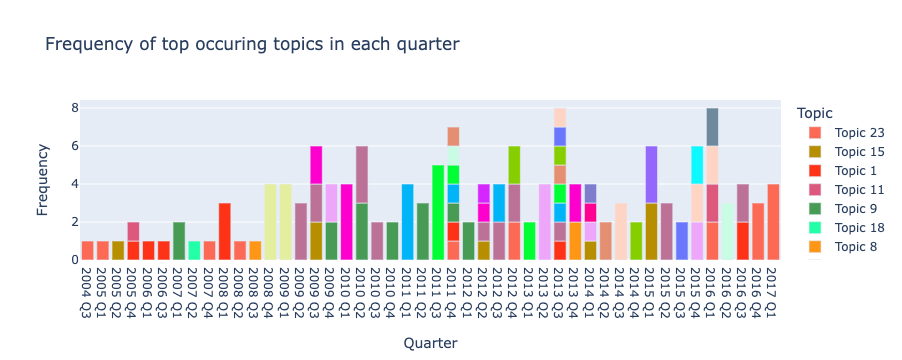

In [50]:
fig = px.bar(q_df_mode2, x='quarter2', y = 'value', color = 'variable',
            labels={'quarter2': 'Quarter',
                    'value': 'Frequency',
                   'variable': 'Topic'},
            title = "Frequency of top occuring topics in each quarter",
            color_discrete_map=colors
            )
fig.update_xaxes(title_text="Quarter", categoryorder='category ascending')

fig.show()

* At the beginning and at the end, we see more of Topic 23 (election).
* 2008 Q4 - 2009 Q1: mostly Topic 19(economy-financial-crisis) as there was an actual economic crisis.
* Obama's presidential term (Elected on Nov/2008; Jan/2009-Jan/2013-Jan/2017): Topic 21 (faith-family) appears frequently.
* Topic 9 (Iraq-Afghanistan-War) also appear often.
* 2011 Q4: Topic 14 (Libya) which is related to 2011 military intervention in Libya.
* Most various topics are discussed in 2013 Q3, which might be due to the start of Obama's second term.


## Plots: Sentiment and Topics per Quarter

In [51]:
df_ssnmf.head()
q_sent = df_ssnmf.loc[:, ['stanza', 'textblob', 'vader', 'topic', 'quarter']]

q_sent_mean = q_sent.groupby('quarter').mean()
q_sent_mean['quarter2'] = q_sent_mean.index
q_sent_mean

,stanza,textblob,vader,quarter2
quarter,,,,
2004 Q3,-0.018000,0.153000,1.000000,2004 Q3
2005 Q1,-0.208000,0.183000,0.994000,2005 Q1
2005 Q2,-0.204000,0.143000,1.000000,2005 Q2
2005 Q4,-0.202500,0.087500,0.966000,2005 Q4
2006 Q1,0.038000,0.221000,0.997000,2006 Q1
2006 Q3,-0.020000,0.147000,0.999000,2006 Q3
2007 Q1,-0.200500,0.118750,0.209000,2007 Q1
2007 Q2,-0.118000,0.086000,0.998000,2007 Q2
2007 Q4,-0.305000,0.106000,0.989000,2007 Q4


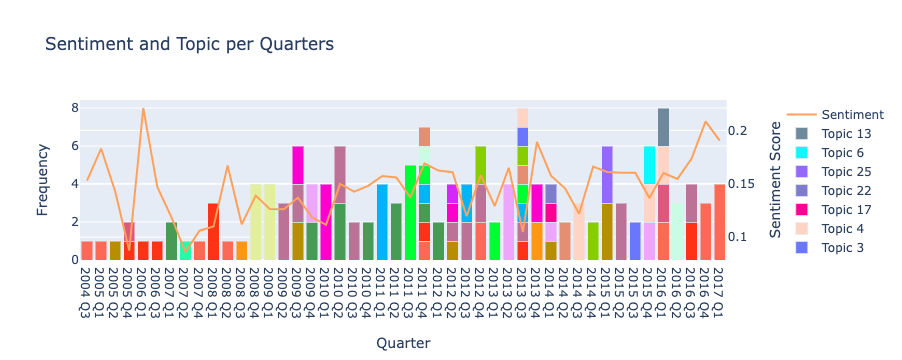

In [52]:
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
for t in q_df_mode2['variable'].unique():
    dfp = q_df_mode2[q_df_mode2['variable']==t]
    fig.add_trace(
        go.Bar(x=dfp['quarter2'], y=dfp['value'], marker_color =colors[t], name = t),
        secondary_y=False,
        )
    # var+=1


fig.add_trace(
    go.Scatter(x=q_sent_mean['quarter2'], y=q_sent_mean['textblob'], name="Sentiment"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Sentiment and Topic per Quarters", 
    barmode = 'stack'
)


# Set x-axis title
fig.update_xaxes(title_text="Quarter", categoryorder='category ascending')

# Set y-axes titles
fig.update_yaxes(title_text="Frequency", secondary_y=False)
fig.update_yaxes(title_text="Sentiment Score", secondary_y=True)

# To save the image 
# fig.update_layout(showlegend=False) 
# fig.update_layout(legend=dict(
#     orientation="h",
#     yanchor="top",
#     y=-1.50,
#     xanchor="right",
#     x=1,
#      font=dict(
#             size=12,
#         ),
# ))


fig.show()


* As of the start of the presidential term (2008 Q4) generally, the sentiment tends to increase.